In [1]:
import os
import shutil
directory = "./Sign Inventory/"
from bs4 import BeautifulSoup
import pandas as pd

In [2]:
import_folder_list = []
output_folder_list = []

for x in os.walk(directory):
    if "Imported Photos" in x[0]:
        import_folder_list.append(x[0])
    if "Output" in x[0]:
        output_folder_list.append(x[0])

In [3]:
from os import listdir
from os.path import isfile, join
count = 0
for x in import_folder_list:
    mypath = x
    importfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    print(x, ": ", len(importfiles))
    count+= len(importfiles)

print(count)

./Sign Inventory/Ipad1 Split 2\Ipad1 Split 2\Imported Photos :  371
./Sign Inventory/Ipad1 Split1\Ipad1 Split1\Imported Photos :  360
./Sign Inventory/Ipad2 Split 1\Ipad2 Split 1\Imported Photos :  323
./Sign Inventory/Ipad2 Split 2\Ipad2 Split 2\Imported Photos :  328
./Sign Inventory/Ipad2 Split 3\Ipad2 Split 3\Imported Photos :  336
./Sign Inventory/Ipad2 Split 4\Ipad2 Split 4\Imported Photos :  333
./Sign Inventory/Ipad2 Split 5\Ipad2 Split 5\Imported Photos :  333
./Sign Inventory/Ipad2 Split 6\Ipad2 Split 6\Imported Photos :  333
./Sign Inventory/Ipad2 Split 7\Ipad2 Split 7\Imported Photos :  335
./Sign Inventory/Ipad3 Split 1\Ipad3 Split 1\Imported Photos :  323
./Sign Inventory/Ipad3 Split 2\Ipad3 Split 2\Imported Photos :  322
./Sign Inventory/Ipad3 Split 3\Ipad3 Split 3\Imported Photos :  324
./Sign Inventory/Ipad3 Split 4\Ipad3 Split 4\Imported Photos :  322
./Sign Inventory/Ipad3 Split 5\Ipad3 Split 5\Imported Photos :  322
./Sign Inventory/Ipad4 Split 1\Ipad4 Split 1\Impor

In [4]:
#put all kml files into a specific folder
def move_files():
    from os import listdir
    from os.path import isfile, join
    dest_folder = r"./kml/"
    for x in output_folder_list:
        mypath = x
        onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
        for y in onlyfiles:
            if ".kml" in y:
                save_file = (x + "\\" + y)
                shutil.copy(save_file, dest_folder)

In [5]:
mypath = r"./kml/"
kmlfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

In [6]:
len(kmlfiles)

18

In [7]:
from bs4 import BeautifulSoup
import pandas as pd
import matplotlib.pyplot as plt
from sign_cleaning_functions import make_sign_df, map_points

In [10]:
input_file = r"./kml/" + kmlfiles[0] 
map_df = make_sign_df(input_file)


In [11]:
point_map = map_points(map_df, 'First Sample Signs')
point_map

In [12]:
map_df['kml'] = kmlfiles[0] 

In [13]:
input_file = r"./kml/" + kmlfiles[0] 
map_df = make_sign_df(input_file)
map_df['kml']=kmlfiles[0] 
map_df['folder']=kmlfiles[0][:-4]
print(map_df.shape)

for num in range(1,18):
    input_file = r"./kml/" + kmlfiles[num] 
    map_df_temp = make_sign_df(input_file)
    map_df_temp['kml']=kmlfiles[num] 
    map_df_temp['folder']=kmlfiles[num][:-4]
    map_df = map_df.append(map_df_temp)
    print(map_df.shape)

(371, 32)
(731, 32)
(1054, 32)
(1382, 32)
(1718, 32)
(2051, 32)
(2384, 32)
(2717, 32)
(3052, 32)
(3375, 32)
(3697, 32)
(4021, 32)
(4343, 32)
(4665, 32)
(5007, 32)
(5348, 32)
(5690, 32)
(6032, 32)


In [14]:
point_map = map_points(map_df, 'Sign_map')
point_map

In [51]:
other_sign_type_list = []

for x in map_df['Sign Type']:
    if x in ['Regulatory','Informational','Warning', 'Mile Post', 'Directional','Overlook Ahead', 'Overlook',
            'Entrance']:
        other_sign_type_list.append(x)
    else:
        other_sign_type_list.append("Other")
        
map_df['Sign Type Grouped']=other_sign_type_list

In [15]:
map_df.to_csv("signs_all_data.csv")

In [53]:
1209+1201+931+707+691+505+444+271+73

6032

In [54]:
map_df['Sign Type Grouped'].value_counts()

Regulatory        1209
Informational     1201
Warning            931
Mile Post          707
Directional        691
Overlook Ahead     505
Other              444
Overlook           271
Entrance            73
Name: Sign Type Grouped, dtype: int64

In [55]:
map_df = map_df.reset_index()

In [56]:
def put_files_into_folder(map_df, folder, sign_type):
    from pathlib import Path
    for x in map_df.index:
        dest_folder = r"./Sign Inventory by Subtype/" + str(folder)
        if map_df['Sign Type Grouped'][x]==sign_type:
            save_file = "./Sign Inventory/" + str(map_df['folder'][x]) + "/" + str(map_df['folder'][x]) + "/Imported Photos/"+ str(map_df['Image File Name'][x])
            my_file = Path(save_file)
#            if my_file.is_file():
#                print(save_file) #qc'ing
#                continue
            shutil.copy(save_file, dest_folder)
            final_save_file  =  dest_folder + "/" +str(map_df['folder'][x])+"_"+str(map_df['Image File Name'][x])
            initial_name_file =  dest_folder + "/" + str(map_df['Image File Name'][x])
            shutil.move(initial_name_file, final_save_file)
    print("All " + str(sign_type) + " signs added to " + str(folder) + " folder")

In [57]:
put_files_into_folder(map_df, "Overlook Ahead",  "Overlook Ahead")
put_files_into_folder(map_df, "Overlook",  "Overlook")
#put_files_into_folder(map_df, "Directional",  "Directional")
put_files_into_folder(map_df, "Entrance",  "Entrance")
put_files_into_folder(map_df, "Informational",  "Informational")
put_files_into_folder(map_df, "Other",  "Other")
put_files_into_folder(map_df, "Regulatory",  "Regulatory")
put_files_into_folder(map_df, "Warning",  "Warning")
#put_files_into_folder(map_df, "Mile Post",  "Mile Post")

All Overlook Ahead signs added to Overlook Ahead folder
All Overlook signs added to Overlook folder
All Entrance signs added to Entrance folder
All Informational signs added to Informational folder
All Other signs added to Other folder
All Regulatory signs added to Regulatory folder
All Warning signs added to Warning folder


## Add mileposts

For this section, we will do a spatial join to the closest 0.1 mileposts then round down

In [58]:
import geopandas as gpd
from shapely.geometry import Point

# Filepath
fp = "./GIS Data/Milepost_Tenths.shp"

# Read the data
pop = gpd.read_file(fp)

geometry = [Point(xy) for xy in zip(pop['Long_DD'], pop['Lat_DD'])]# Coordinate reference system : WGS84
pop['geometry']=geometry

In [59]:
pop.head(11)

,Tenth,X,Y,Long_DD,Lat_DD,StreetNUM,geometry
0,0.0,"78° 51' 30.67"" W","38° 1' 54.41"" N",-78.858521,38.031780,0000,POINT (-78.8585208027 38.0317798476)
1,0.2,"78° 51' 26.32"" W","38° 1' 44.13"" N",-78.857310,38.028926,0002,POINT (-78.85731046959999 38.028926343)
2,0.4,"78° 51' 36.57"" W","38° 1' 37.09"" N",-78.860157,38.026969,0004,POINT (-78.8601573153 38.0269691968)
3,1.0,"78° 52' 9.69"" W","38° 1' 25.21"" N",-78.869358,38.023671,0010,POINT (-78.8693578756 38.023670753)
4,0.9,"78° 52' 4.84"" W","38° 1' 29.11"" N",-78.868010,38.024752,0009,POINT (-78.86801030159999 38.0247520317)
5,0.8,"78° 51' 58.08"" W","38° 1' 30.28"" N",-78.866133,38.025078,0008,POINT (-78.8661328315 38.0250776432)
6,0.7,"78° 51' 51.55"" W","38° 1' 28.36"" N",-78.864319,38.024545,0007,POINT (-78.8643185887 38.0245447706)
7,0.6,"78° 51' 45.63"" W","38° 1' 29.71"" N",-78.862676,38.024921,0006,POINT (-78.86267588290001 38.0249207075)
8,0.5,"78° 51' 42.92"" W","38° 1' 34.79"" N",-78.861923,38.026331,0005,POINT (-78.8619230067 38.026331101)
9,0.3,"78° 51' 30.45"" W","38° 1' 39.82"" N",-78.858458,38.027728,0003,POINT (-78.8584583299 38.0277276039)


In [60]:
geometry = [Point(xy) for xy in zip(map_df['LON'], map_df['LAT'])]# Coordinate reference system : WGS84
crs = {'init': 'epsg:4326'}# Creating a Geographic data frame 
gdf = gpd.GeoDataFrame(map_df, crs=crs, geometry=geometry)

In [61]:
gdf.head()

,index,Image File Name,LON,LAT,Sign Type,Multiple Signs,Sign Owner,Physical Location,Parkway Location,District,...,Maintenance Required,Sign Material,Sign Face,Post Material,Post Size,Number of posts,kml,folder,Sign Type Grouped,geometry
0,0,IMG_0366.JPG,-80.788025,36.606993,Informational,No,NPS,State Road,PWL,Plateau Milepost (106-216.7),...,Broken or Bent,Carsonite,Printed,Other (Carsonite),Other (Flat),1,Ipad1 Split 2.kml,Ipad1 Split 2,Informational,POINT (-80.78802488029351 36.6069934567043)
1,1,IMG_0367.JPG,-80.785947,36.606735,Directional,Yes,Non NPS (usually found on public roads),State Road,PWL,Plateau Milepost (106-216.7),...,None,Aluminum,Scotchlite Reflective,Wood,4x4,1,Ipad1 Split 2.kml,Ipad1 Split 2,Directional,POINT (-80.7859473460358 36.6067353439086)
2,2,IMG_0368.JPG,-80.787104,36.607143,Directional,Yes,Non NPS (usually found on public roads),State Road,PWL,Plateau Milepost (106-216.7),...,None,Aluminum,Scotchlite Reflective,Wood,4x4,1,Ipad1 Split 2.kml,Ipad1 Split 2,Directional,POINT (-80.7871042798228 36.6071432490034)
3,3,IMG_0369.JPG,-80.779468,36.614135,Regulatory,Yes,NPS,Motor Road,PWL,Plateau Milepost (106-216.7),...,None,Aluminum,Scotchlite Reflective,Metal,2x2,1,Ipad1 Split 2.kml,Ipad1 Split 2,Regulatory,POINT (-80.77946785271121 36.6141347380776)
4,4,IMG_0370.JPG,-80.780113,36.614600,Regulatory,Yes,NPS,Motor Road,PWL,Plateau Milepost (106-216.7),...,None,Aluminum,Scotchlite Reflective,Metal,2x2,1,Ipad1 Split 2.kml,Ipad1 Split 2,Regulatory,POINT (-80.78011337401691 36.614600142952)


In [62]:
pop = pop[['Tenth', 'geometry']]
pop.head()

,Tenth,geometry
0,0.0,POINT (-78.8585208027 38.0317798476)
1,0.2,POINT (-78.85731046959999 38.028926343)
2,0.4,POINT (-78.8601573153 38.0269691968)
3,1.0,POINT (-78.8693578756 38.023670753)
4,0.9,POINT (-78.86801030159999 38.0247520317)


In [63]:
import geopandas as gpd
import numpy as np
import pandas as pd

from scipy.spatial import cKDTree
from shapely.geometry import Point

def ckdnearest(gdA, gdB):
    nA = np.array(list(gdA.geometry.apply(lambda x: (x.x, x.y))))
    nB = np.array(list(gdB.geometry.apply(lambda x: (x.x, x.y))))
    btree = cKDTree(nB)
    dist, idx = btree.query(nA, k=1)
    gdf = pd.concat(
        [gdA.reset_index(drop=True), gdB.loc[idx, gdB.columns != 'geometry'].reset_index(drop=True),
         pd.Series(dist, name='dist')], axis=1)
    return gdf

gdf = ckdnearest(gdf, pop)

In [64]:
0.000725*69 #0.000725 is about 0.05 miles at 38 degree longitude

0.050025

In [65]:
gdf['Tenth_filtered']=gdf['Tenth']
gdf.loc[(gdf['Physical Location']!="Motor Road") | (gdf['dist']>0.000725), 'Tenth_filtered'] = -100

In [66]:
gdf['Mile Post #'] = gdf['Tenth_filtered'].round(0).astype(int)

In [67]:
gdf.head()

,index,Image File Name,LON,LAT,Sign Type,Multiple Signs,Sign Owner,Physical Location,Parkway Location,District,...,Post Size,Number of posts,kml,folder,Sign Type Grouped,geometry,Tenth,dist,Tenth_filtered,Mile Post #
0,0,IMG_0366.JPG,-80.788025,36.606993,Informational,No,NPS,State Road,PWL,Plateau Milepost (106-216.7),...,Other (Flat),1,Ipad1 Split 2.kml,Ipad1 Split 2,Informational,POINT (-80.78802488029351 36.6069934567043),207.2,0.000203,-100.0,-100
1,1,IMG_0367.JPG,-80.785947,36.606735,Directional,Yes,Non NPS (usually found on public roads),State Road,PWL,Plateau Milepost (106-216.7),...,4x4,1,Ipad1 Split 2.kml,Ipad1 Split 2,Directional,POINT (-80.7859473460358 36.6067353439086),207.1,0.000609,-100.0,-100
2,2,IMG_0368.JPG,-80.787104,36.607143,Directional,Yes,Non NPS (usually found on public roads),State Road,PWL,Plateau Milepost (106-216.7),...,4x4,1,Ipad1 Split 2.kml,Ipad1 Split 2,Directional,POINT (-80.7871042798228 36.6071432490034),207.1,0.000676,-100.0,-100
3,3,IMG_0369.JPG,-80.779468,36.614135,Regulatory,Yes,NPS,Motor Road,PWL,Plateau Milepost (106-216.7),...,2x2,1,Ipad1 Split 2.kml,Ipad1 Split 2,Regulatory,POINT (-80.77946785271121 36.6141347380776),206.4,0.000267,206.4,206
4,4,IMG_0370.JPG,-80.780113,36.614600,Regulatory,Yes,NPS,Motor Road,PWL,Plateau Milepost (106-216.7),...,2x2,1,Ipad1 Split 2.kml,Ipad1 Split 2,Regulatory,POINT (-80.78011337401691 36.614600142952),206.4,0.000537,206.4,206


In [68]:
def round_down(num, divisor):
    return num - (num%divisor)

gdf['Mile Post Tens'] = gdf['Mile Post #'].apply(lambda x: round_down(x, 10))

In [69]:
gdf.head()

,index,Image File Name,LON,LAT,Sign Type,Multiple Signs,Sign Owner,Physical Location,Parkway Location,District,...,Number of posts,kml,folder,Sign Type Grouped,geometry,Tenth,dist,Tenth_filtered,Mile Post #,Mile Post Tens
0,0,IMG_0366.JPG,-80.788025,36.606993,Informational,No,NPS,State Road,PWL,Plateau Milepost (106-216.7),...,1,Ipad1 Split 2.kml,Ipad1 Split 2,Informational,POINT (-80.78802488029351 36.6069934567043),207.2,0.000203,-100.0,-100,-100
1,1,IMG_0367.JPG,-80.785947,36.606735,Directional,Yes,Non NPS (usually found on public roads),State Road,PWL,Plateau Milepost (106-216.7),...,1,Ipad1 Split 2.kml,Ipad1 Split 2,Directional,POINT (-80.7859473460358 36.6067353439086),207.1,0.000609,-100.0,-100,-100
2,2,IMG_0368.JPG,-80.787104,36.607143,Directional,Yes,Non NPS (usually found on public roads),State Road,PWL,Plateau Milepost (106-216.7),...,1,Ipad1 Split 2.kml,Ipad1 Split 2,Directional,POINT (-80.7871042798228 36.6071432490034),207.1,0.000676,-100.0,-100,-100
3,3,IMG_0369.JPG,-80.779468,36.614135,Regulatory,Yes,NPS,Motor Road,PWL,Plateau Milepost (106-216.7),...,1,Ipad1 Split 2.kml,Ipad1 Split 2,Regulatory,POINT (-80.77946785271121 36.6141347380776),206.4,0.000267,206.4,206,200
4,4,IMG_0370.JPG,-80.780113,36.614600,Regulatory,Yes,NPS,Motor Road,PWL,Plateau Milepost (106-216.7),...,1,Ipad1 Split 2.kml,Ipad1 Split 2,Regulatory,POINT (-80.78011337401691 36.614600142952),206.4,0.000537,206.4,206,200


In [70]:
gdf.to_csv("signs_with_mileposts.csv",index=False)

## Reading Sign Text

After we've georeferenced the signs, we want to read the sign text and assign into more precise subtypes. 

In [1]:
from google.cloud import vision

In [3]:
import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"]="My First Project-ecb6eee4d757.json"

In [4]:
client = vision.ImageAnnotatorClient()

In [5]:
import io


In [6]:

path = './Sign Inventory by Subtype\Warning/Ipad1 Split 2_IMG_0459.JPG'
with io.open(path, 'rb') as image_file:
        content = image_file.read()

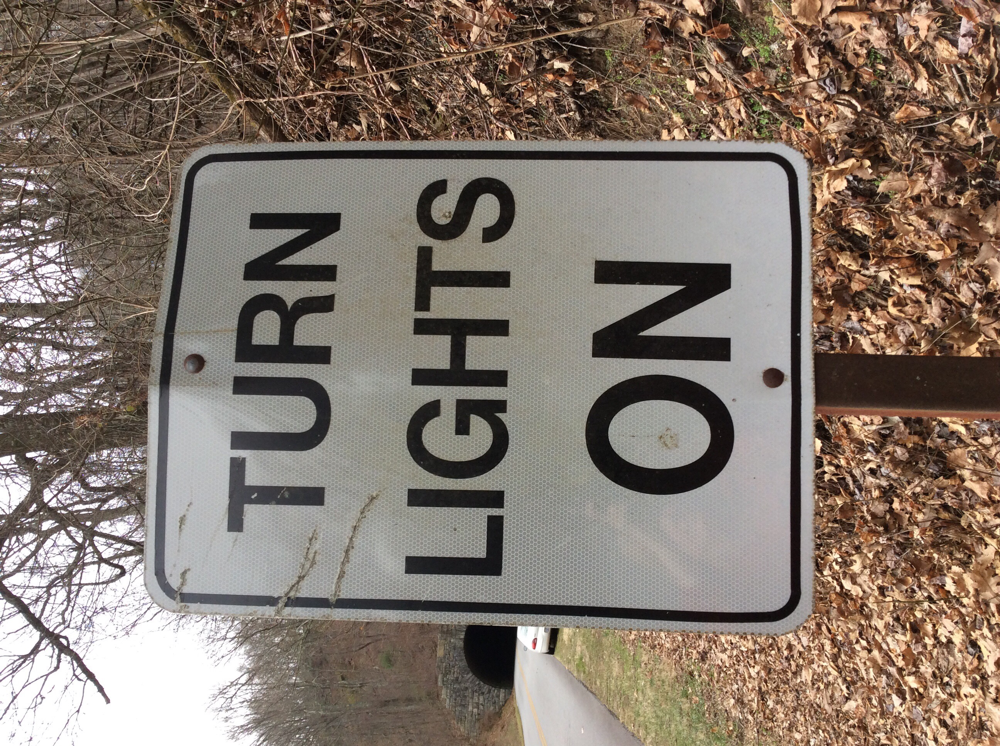

In [8]:
from IPython.display import Image
Image(filename=path) 

In [7]:
image = vision.types.Image(content=content)

In [9]:
response = client.text_detection(image=image)
response

text_annotations {
  locale: "en"
  description: "TURN\nLIGHTS\nON\n"
  bounding_poly {
    vertices {
      x: 442
      y: 578
    }
    vertices {
      x: 1494
      y: 578
    }
    vertices {
      x: 1494
      y: 1878
    }
    vertices {
      x: 442
      y: 1878
    }
  }
}
text_annotations {
  description: "TURN"
  bounding_poly {
    vertices {
      x: 558
      y: 578
    }
    vertices {
      x: 1403
      y: 637
    }
    vertices {
      x: 1385
      y: 891
    }
    vertices {
      x: 540
      y: 832
    }
  }
}
text_annotations {
  description: "LIGHTS"
  bounding_poly {
    vertices {
      x: 447
      y: 1040
    }
    vertices {
      x: 1494
      y: 1061
    }
    vertices {
      x: 1488
      y: 1319
    }
    vertices {
      x: 442
      y: 1298
    }
  }
}
text_annotations {
  description: "ON"
  bounding_poly {
    vertices {
      x: 656
      y: 1520
    }
    vertices {
      x: 1268
      y: 1524
    }
    vertices {
      x: 1266
      y: 1878
 

In [25]:
for text in response.text_annotations:
    print(text)
    #print('=' * 30)
    print(text.description)
#    vertices = ['(%s,%s)' % (v.x, v.y) for v in text.bounding_poly.vertices]
    #print('bounds:', ",".join(vertices))

locale: "en"
description: "TURN\nLIGHTS\nON\n"
bounding_poly {
  vertices {
    x: 442
    y: 578
  }
  vertices {
    x: 1494
    y: 578
  }
  vertices {
    x: 1494
    y: 1878
  }
  vertices {
    x: 442
    y: 1878
  }
}

TURN
LIGHTS
ON

description: "TURN"
bounding_poly {
  vertices {
    x: 558
    y: 578
  }
  vertices {
    x: 1403
    y: 637
  }
  vertices {
    x: 1385
    y: 891
  }
  vertices {
    x: 540
    y: 832
  }
}

TURN
description: "LIGHTS"
bounding_poly {
  vertices {
    x: 447
    y: 1040
  }
  vertices {
    x: 1494
    y: 1061
  }
  vertices {
    x: 1488
    y: 1319
  }
  vertices {
    x: 442
    y: 1298
  }
}

LIGHTS
description: "ON"
bounding_poly {
  vertices {
    x: 656
    y: 1520
  }
  vertices {
    x: 1268
    y: 1524
  }
  vertices {
    x: 1266
    y: 1878
  }
  vertices {
    x: 654
    y: 1874
  }
}

ON


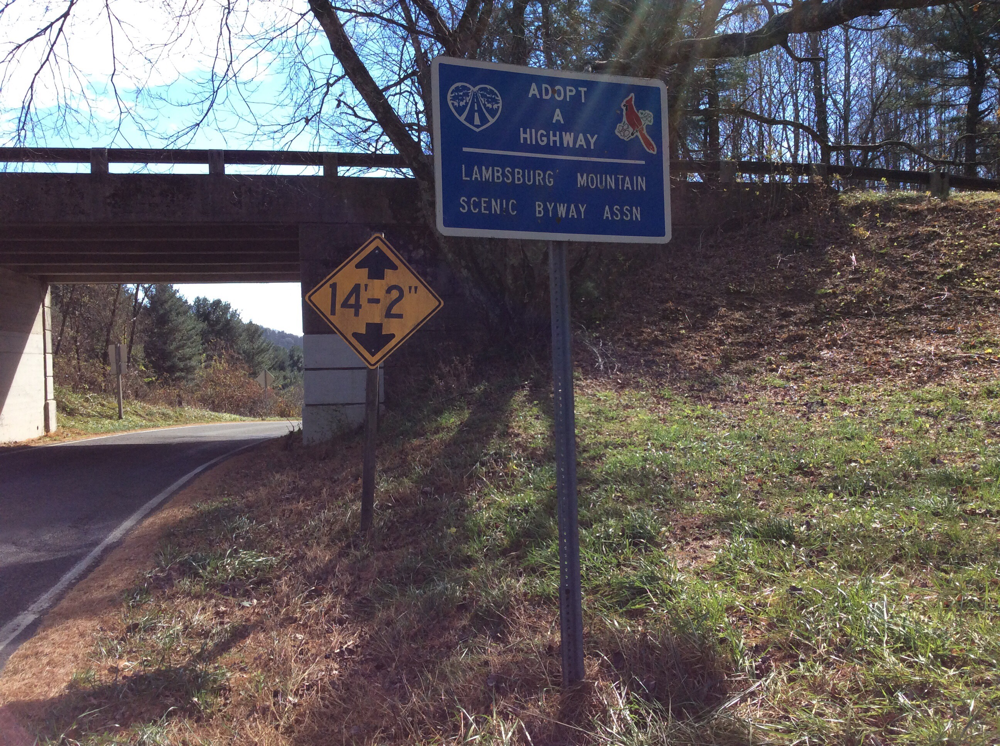

In [26]:
path = './Sign Inventory by Subtype\Informational/Ipad1 Split 2_IMG_0387.JPG'
Ipad1 Split 2_IMG_0423
from IPython.display import Image
Image(filename=path) 

In [27]:
with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
image = vision.types.Image(content=content)
response = client.text_detection(image=image)


In [28]:
for text in response.text_annotations:
    #print(text)
    print('=' * 30)
    print(text.description)

for text in response.text_annotations:
    print('=' * 30)
    print(text)


ADOPT
HIGHWAY
LAMBSBURG MOUNTAIN
SCEN!C BYWAY ASSN
14-2"

ADOPT
HIGHWAY
LAMBSBURG
MOUNTAIN
SCEN!C
BYWAY
ASSN
14-2"
locale: "en"
description: "ADOPT\nHIGHWAY\nLAMBSBURG MOUNTAIN\nSCEN!C BYWAY ASSN\n14-2\"\n"
bounding_poly {
  vertices {
    x: 838
    y: 215
  }
  vertices {
    x: 1674
    y: 215
  }
  vertices {
    x: 1674
    y: 836
  }
  vertices {
    x: 838
    y: 836
  }
}

description: "ADOPT"
bounding_poly {
  vertices {
    x: 1374
    y: 215
  }
  vertices {
    x: 1520
    y: 228
  }
  vertices {
    x: 1517
    y: 264
  }
  vertices {
    x: 1371
    y: 252
  }
}

description: "HIGHWAY"
bounding_poly {
  vertices {
    x: 1349
    y: 332
  }
  vertices {
    x: 1548
    y: 350
  }
  vertices {
    x: 1545
    y: 387
  }
  vertices {
    x: 1346
    y: 370
  }
}

description: "LAMBSBURG"
bounding_poly {
  vertices {
    x: 1188
    y: 422
  }
  vertices {
    x: 1439
    y: 438
  }
  vertices {
    x: 1436
    y: 487
  }
  vertices {
    x: 1185
    y: 471
  }
}

descriptio

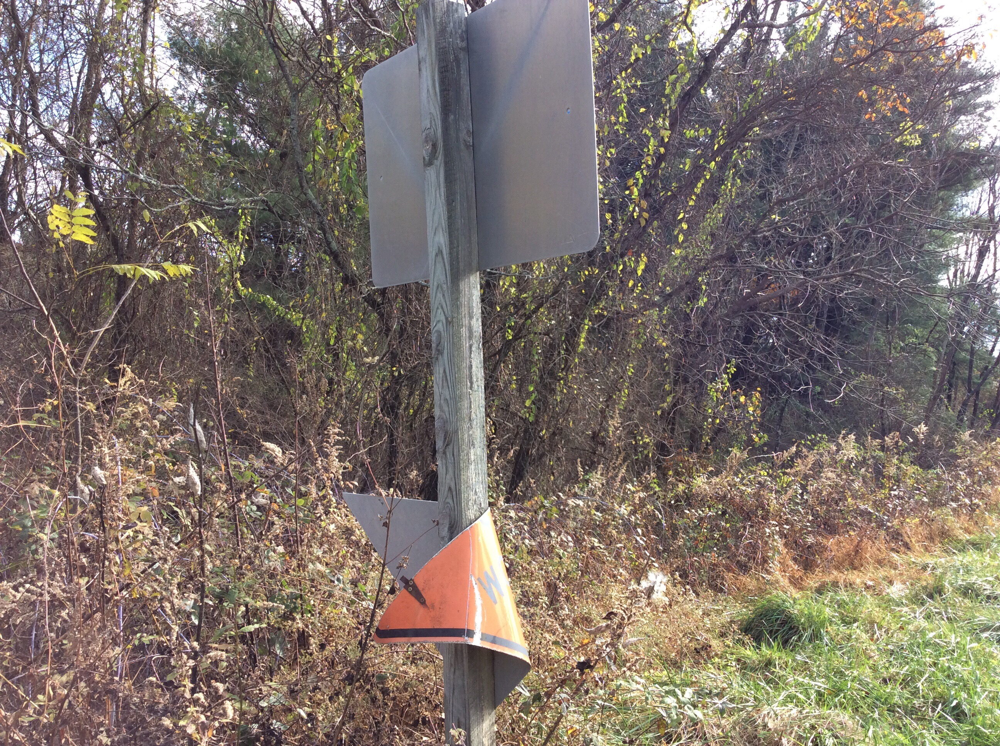

In [29]:
path = './Sign Inventory by Subtype\Informational/Ipad1 Split 2_IMG_0423.JPG'

from IPython.display import Image
Image(filename=path) 

In [30]:
with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
image = vision.types.Image(content=content)
response = client.text_detection(image=image)


In [31]:
for text in response.text_annotations:
    #print(text)
    print('=' * 30)
    print(text.description)

for text in response.text_annotations:
    print('=' * 30)
    print(text)


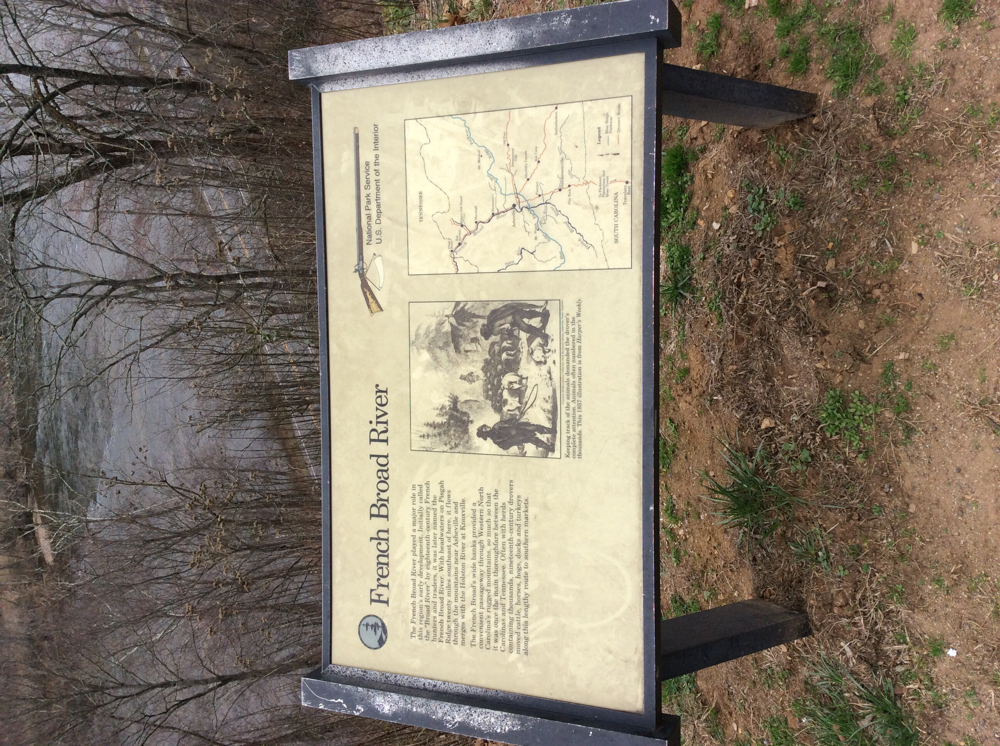

In [34]:
path = './Sign Inventory by Subtype\Informational/Ipad1 Split 2_IMG_0467.JPG'
from IPython.display import Image
Image(filename=path) 

In [35]:
with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
image = vision.types.Image(content=content)
response = client.text_detection(image=image)


In [76]:
def run_vision_api(image_path):
    with io.open(image_path, 'rb') as image_file:
            content = image_file.read()

    image = vision.types.Image(content=content)
    response = client.text_detection(image=image)
    return response

In [101]:
count = 0
response_list=[]
text_list = []
index_list = []
run_count = 0

for x in map_df.index:
    index_list.append(x)
    text_response = ""
    count+=1
    if count%100==0:
        print(x, "done | length of text list: ", len(text_list), "| length of response list: ", len(response_list))
        print(text_list[-1])
    if map_df['Sign Type Grouped'][x]=="Mile Post":
        response_list.append("Mile Post")
        text_list.append("Mile Post")
        continue
    if map_df['Sign Type Grouped'][x]=="Overlook Ahead":
        response_list.append("Overlook Ahead")
        text_list.append("Overlook Ahead")
        continue
    
    image_path = "./Sign Inventory/" + str(map_df['folder'][x]) + "/" + str(map_df['folder'][x]) + "/Imported Photos/"+ str(map_df['Image File Name'][x])
    #print(image_path)

    response = run_vision_api(image_path)
    run_count+=1
    response_list.append(response)
    for text in response.text_annotations:
        #print(text)
        text_response = text.description
        break
    
    text_list.append(text_response)
    
   # if count>5:
   #     break

99 done | length of text list:  99 | length of response list:  99
PARKWAY
SPEED LIMIT
45
FASTEN
SEAT BELTS
LA

199 done | length of text list:  199 | length of response list:  199
BLUE RIDGE PARKWAY
NATIONAL
PARK
SERVICE
VISITOR CENTER
&
HEADQUARTERS

299 done | length of text list:  299 | length of response list:  299
BLUE
RIDGE
PARKWAY
TNORTH
SOUTH >

399 done | length of text list:  399 | length of response list:  399

499 done | length of text list:  499 | length of response list:  499
• MAN P NG
OVERFLOW PAKING+
+OVERFLOW PuNG
ROAD CLOSED
DO NOT ENTER

599 done | length of text list:  599 | length of response list:  599

699 done | length of text list:  699 | length of response list:  699
FISHERS PEAK RD
ROTHILLS

799 done | length of text list:  799 | length of response list:  799
Shenandoah
National Park
Blue Ridge
Parkway
500 FEET AHEAD
Jeap
ISH-8849

899 done | length of text list:  899 | length of response list:  899
Visitor
Center
NATIONAL
PARK
SERVICE
Department
of the Inte

In [102]:
print(len(index_list),len(text_list),len(response_list))

6032 6032 6032


In [103]:
map_df['raw text'] = text_list
#map_df['raw response']=response_list #raw responses messes up Excel doc

In [105]:
response_df = pd.DataFrame({"index":index_list,
                           "Responses": response_list,
                           "Text": text_list})

In [106]:
response_df.to_csv("responses.csv")

In [108]:
map_df.to_csv("signs_with_mileposts_and_text.csv",index=False)